In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib

## Downloading locally
- The easiest way to install diad fit is by removing the #, and running this once per computer. When I update the code, you'll need to get the new tag off GitHub:
https://github.com/PennyWieser/DiadFit/tags
Right click on the top one, over the 'zip' icon, click copy link address
- If youve already done this for Ne, you dont need to do here too

In [2]:
#!pip install --upgrade "https://github.com/PennyWieser/DiadFit/archive/refs/tags/0.0.11.zip"

### This imports DiadFit, and gives you the version. In all communication with Penny, make sure you say the version!


In [3]:
import DiadFit as pf
pf.__version__

'0.0.37'

In [4]:
## load dataframes and numpy arrays 
np_x = joblib.load('np_x.sav')
Group1_np_y=joblib.load('Group1_np.sav')
Group1_df=joblib.load('Group1_df.sav')

In [5]:
DayFolder=r'G:\My Drive\Berkeley_NEW\DiadFit_outer\docs\Examples\Diad_Fitting_Nov22nd2022'
meta_path=DayFolder +  '\MetaData'
spectra_path=DayFolder + '\Spectra'

In [6]:
# This specifies what file type your Raman exported in. 
filetype='headless_txt' # Specifies raman file format 
file_ext='.txt'
prefix=False

## Now load the files of interest

In [7]:
Diad_Files_Weak =Group1_df['filename']
Diad_Files_Weak[0:5]

28    POC35.txt
29    POC36.txt
30    POC37.txt
31    POC38.txt
32    POC39.txt
Name: filename, dtype: object

POC46.txt


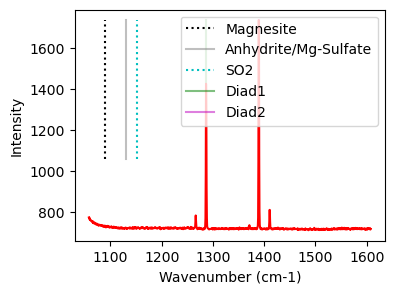

In [8]:
i=11
print(Group1_df['filename'].iloc[i])
plot1=pf.plot_diad(Spectra_x=np_x, Spectra_y=Group1_np_y[:, i])

## Decide if you want a secondary peak
- If you dont have the peak, it is only a little slower, but it works if it only appears in a small number of spectra still

In [9]:
# Decide if you want to fit a carbonate peak or not here. 
fit_sec_peak=False

if fit_sec_peak is True:

    # Tweak options here, can exclude a range for example using exclude_range=Tuple[float, float]
    generic_Config=pf.generic_peak_config(lower_bck=(1110, 1130), 
    upper_bck=(1160, 1180), cent_generic=1150, name='SO2')

    generic_fit=pf.fit_generic_peak(config=generic_Config, path=spectra_path, 
    filename=filename_Weak, filetype=filetype)
    generic_fit

## Now lets inspect the diads and get their approximate positions
- As with generic peak, you can exclude 2 segments (e.g. around cosmic rays)
- You then specify how many peaks you want to fit on each diad. 1 means just the strong peak, 2 hotbands, and 3 for Diad2 would also fit the C13 peak if present. 
- The identify_diad_peaks then uses scipy findpeaks to identify the positions of the 2 diads, and any other peaks the user asks for. These are saved, and fed into the later functions for peak fitting. 

In [10]:
## Choose a model - option, pseudovoigt or voigt
model_name='PseudoVoigtModel'
# Specify the number of peaks, 1 = just peak, 2 = Peak+hot bands
n_peaks_diad1=2
n_peaks_diad2=3

## Fit Diad 1
- You can tweak the parameters in diad1_fit_config

In [11]:
diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
diad_id_config
diad_sigma=0.6
diad1_fit_config_init=pf.diad1_fit_config(
    model_name=model_name,
N_poly_bck_diad1=3, lower_bck_diad1=(1180, 1220),
upper_bck_diad1=(1330, 1350),
diad_sigma=diad_sigma,
x_range_residual=10, x_range_baseline=30, 
 y_range_baseline=1000, 
HB_prom=Group1_df['HB1_prom'].iloc[i],
diad_prom=Group1_df['Diad1_prom'].iloc[i])
diad1_fit_config_init

diad1_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.6, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, N_poly_bck_diad1=3, lower_bck_diad1=(1180, 1220), upper_bck_diad1=(1330, 1350), diad_prom=708.1999817000001, HB_prom=61.79998780000005, x_range_baseline=30, y_range_baseline=1000, plot_figure=True, dpi=200, x_range_residual=10, return_other_params=False)

,Diad1_Combofit_Cent,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Diad1_Voigt_Gamma,HB1_Cent,HB1_Area,HB1_Sigma,Diad1_Combofit_Height,Residual_Diad1,Diad1_Prop_Lor,Diad1_fwhm,Diad1_refit
0,1286.640368,1286.640418,1081.65822,0.613453,None,1266.294253,108.566227,0.652077,754.960032,2.202266,0.274533,1.226905,Flagged Warnings:


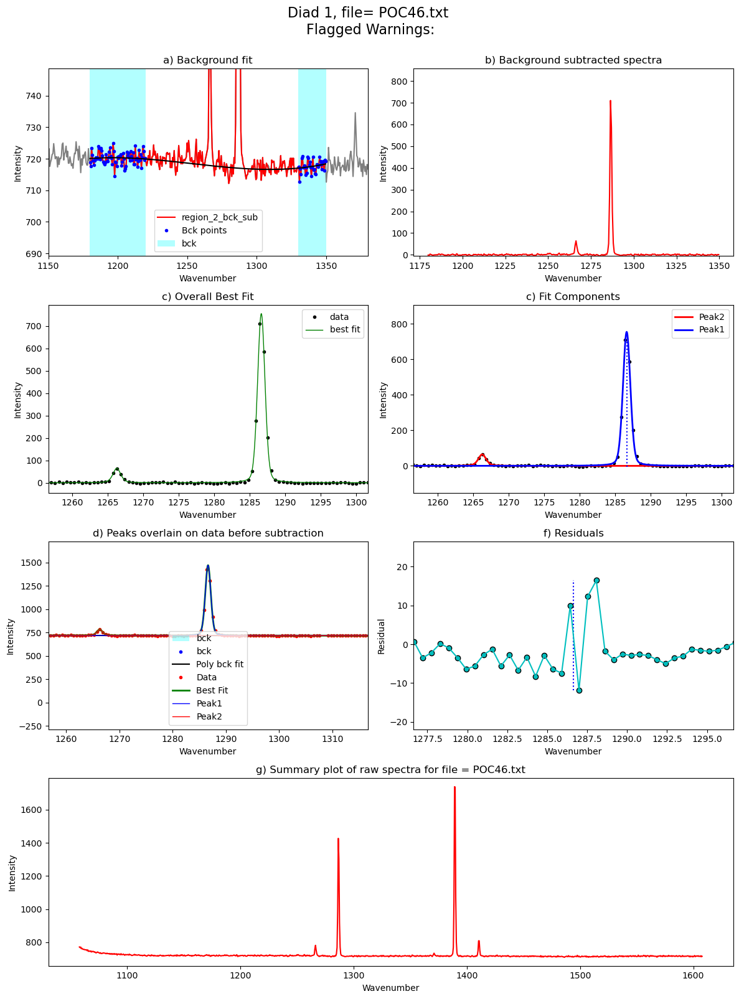

In [12]:
Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
config2=diad_id_config,
path=spectra_path, filename=Group1_df['filename'].iloc[i],
filetype=filetype, close_figure=False,
Diad_pos=Group1_df['Diad1_pos'].iloc[i],
HB_pos=Group1_df['HB1_pos'].iloc[i], 
 fit_peaks=2)
Diad1_fit

## Fit diad 2

In [13]:
diad_sigma=0.6
diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name, 
lower_bck_diad2=(1310, 1340), diad_sigma=diad_sigma,  N_poly_bck_diad2=3,                                       
x_range_residual=30, y_range_baseline=1000,  
x_range_baseline=30,
HB_prom=Group1_df['HB2_prom'].iloc[i], 
diad_prom=Group1_df['Diad2_prom'].iloc[i])
diad2_fit_config_init



diad2_fit_config(model_name='PseudoVoigtModel', peak_pos_gauss=None, gauss_sigma=1, gauss_amp=3000, diad_sigma=0.6, diad_sigma_min_allowance=0.2, diad_sigma_max_allowance=5, C13_sigma=0.1, sigma_allowance=10, N_poly_bck_diad2=3, lower_bck_diad2=(1310, 1340), upper_bck_diad2=(1440, 1470), diad_prom=1021.8000179000001, HB_prom=nan, x_range_baseline=30, y_range_baseline=1000, plot_figure=True, dpi=200, x_range_residual=30, return_other_params=False)

,Diad2_Combofit_Cent,Diad2_Voigt_Cent,Diad2_Voigt_Area,Diad2_Voigt_Sigma,Diad2_Voigt_Gamma,Diad2_Combofit_Height,Residual_Diad2,Diad2_Prop_Lor,Diad2_fwhm,Diad2_refit
0,1389.392235,1389.392235,1587.719283,0.588578,None,1182.121514,3.768952,0.210338,1.177157,Flagged Warnings:


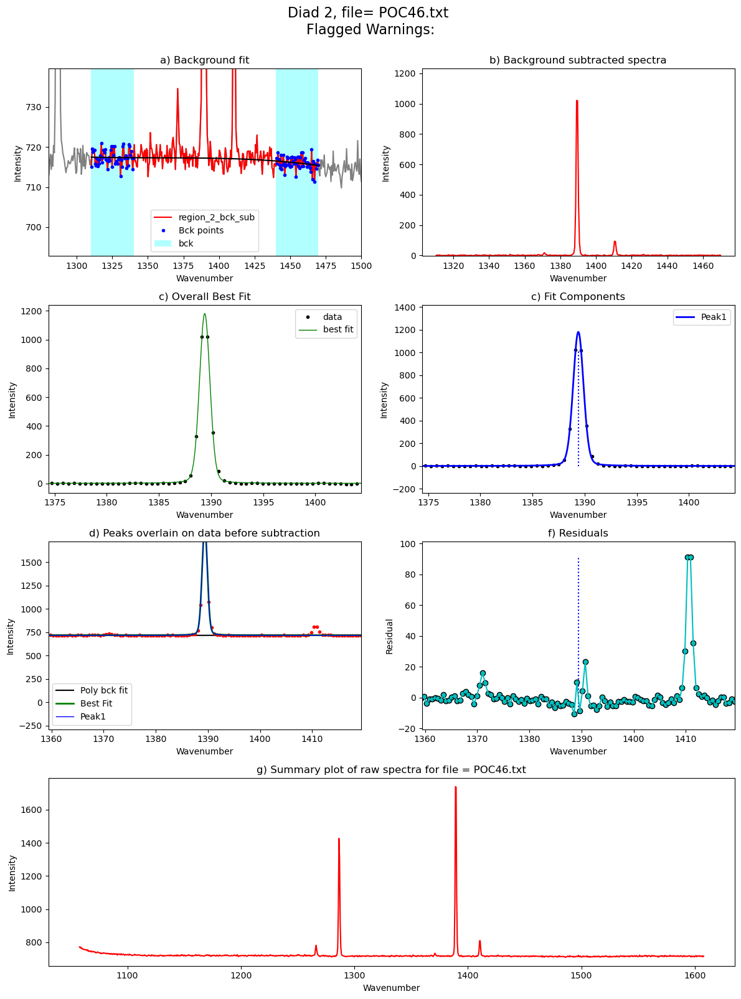

In [14]:
Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
    config2=diad_id_config,
path=spectra_path, filename=Group1_df['filename'].iloc[i], filetype=filetype,
close_figure=False, 
fit_peaks=2, 
Diad_pos=Group1_df['Diad2_pos'].iloc[i],
HB_pos=Group1_df['HB2_pos'].iloc[i], 
C13_pos=Group1_df['C13_pos'].iloc[i])
Diad2_fit.to_clipboard(excel=True)
Diad2_fit

## You can also try looping if all your spectra are pretty similar

 42%|██████████████████████████████████▏                                               | 10/24 [00:18<00:27,  1.94s/it]g:\my drive\berkeley_new\diadfit_outer\src\DiadFit\diads.py:3088: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axes=plt.subplot_mosaic(mosaic=figure_mosaic, figsize=(12, 16))
100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [00:44<00:00,  1.85s/it]


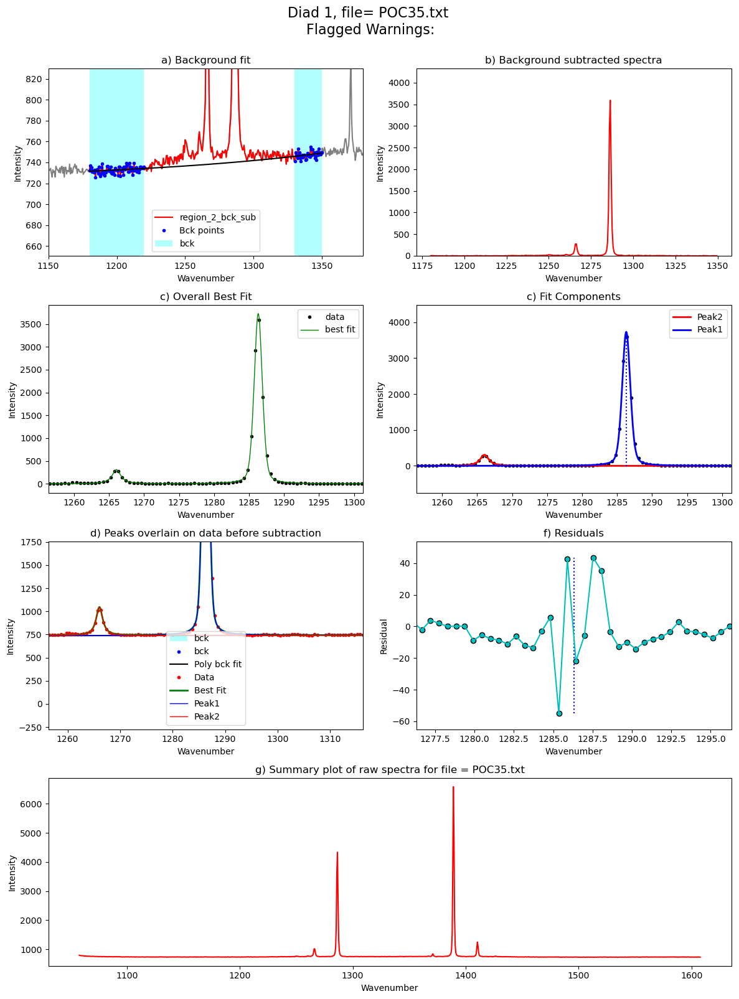

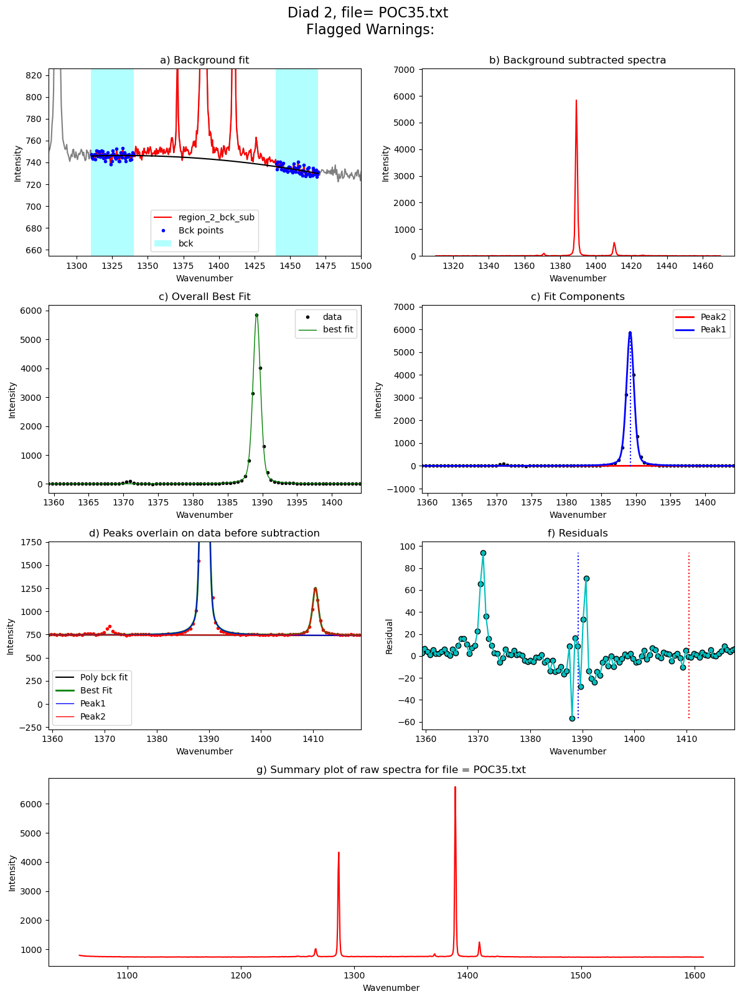

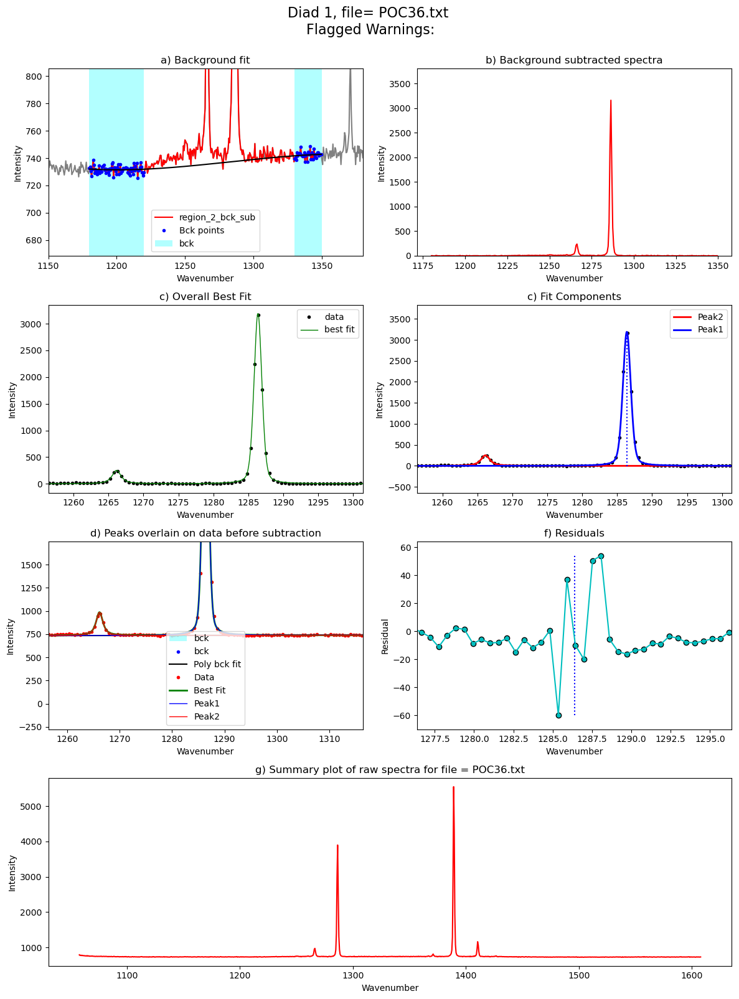

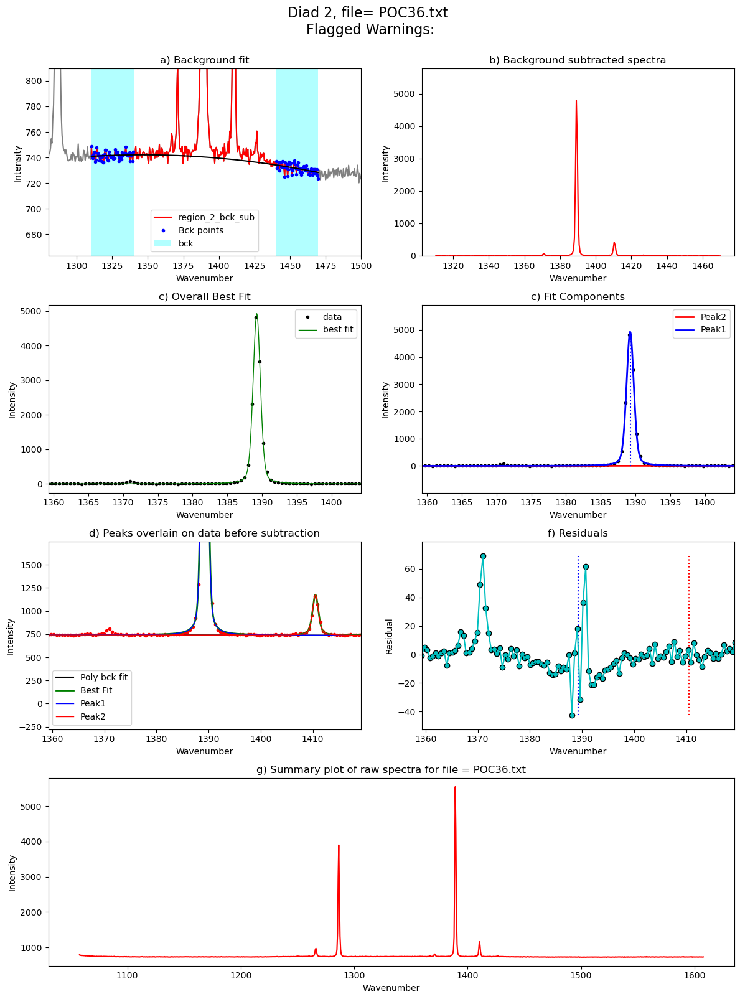

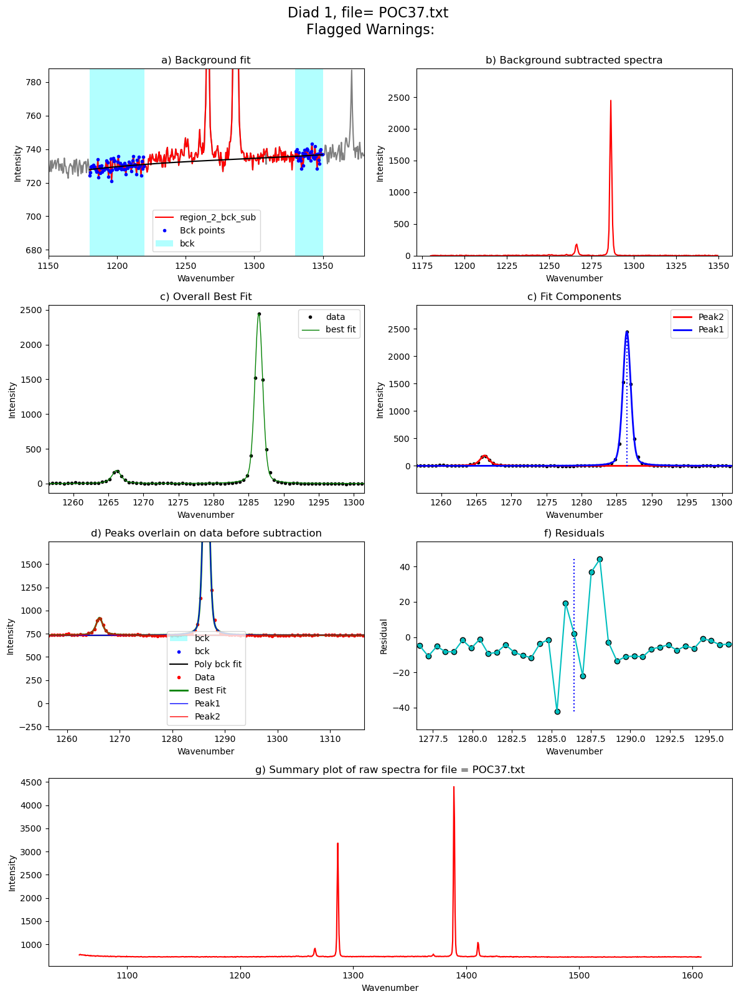

...

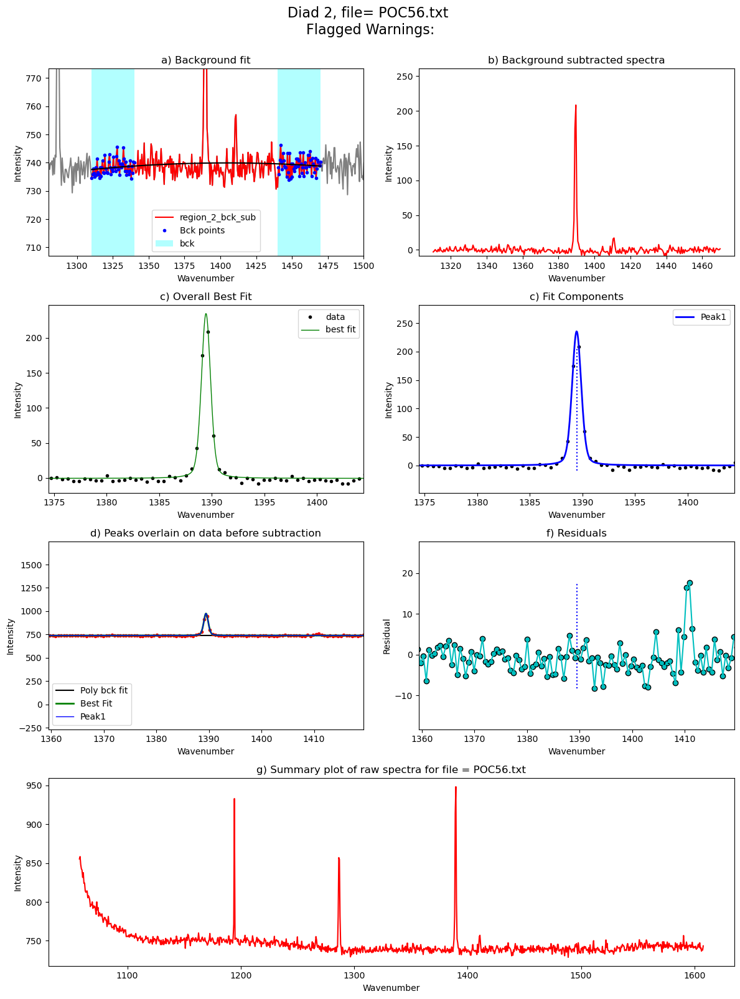

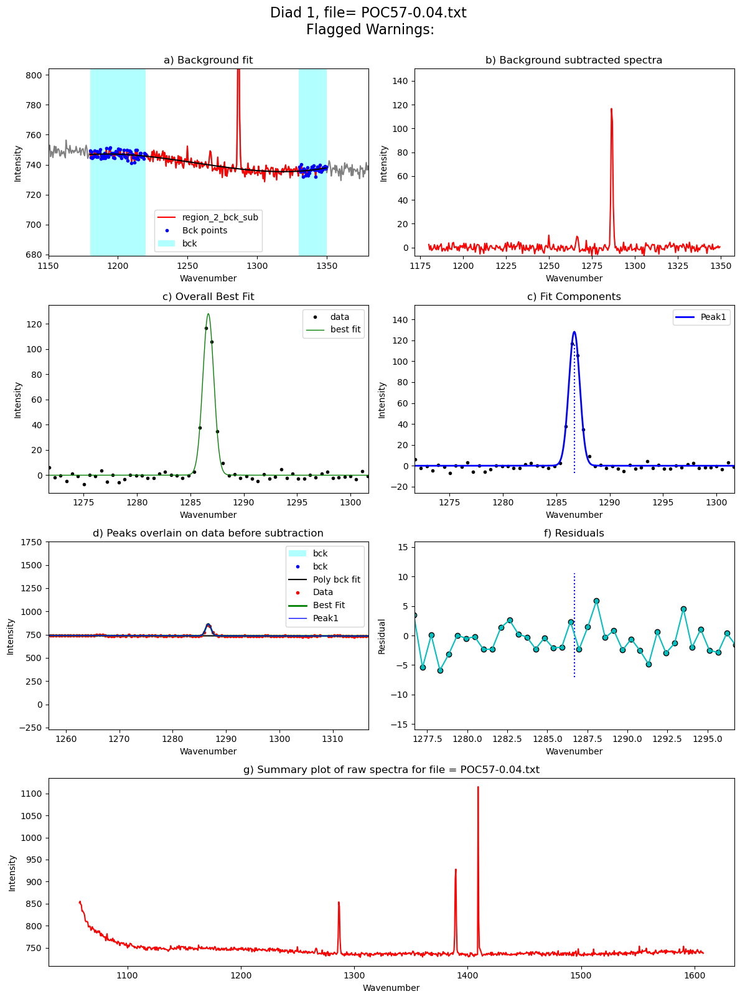

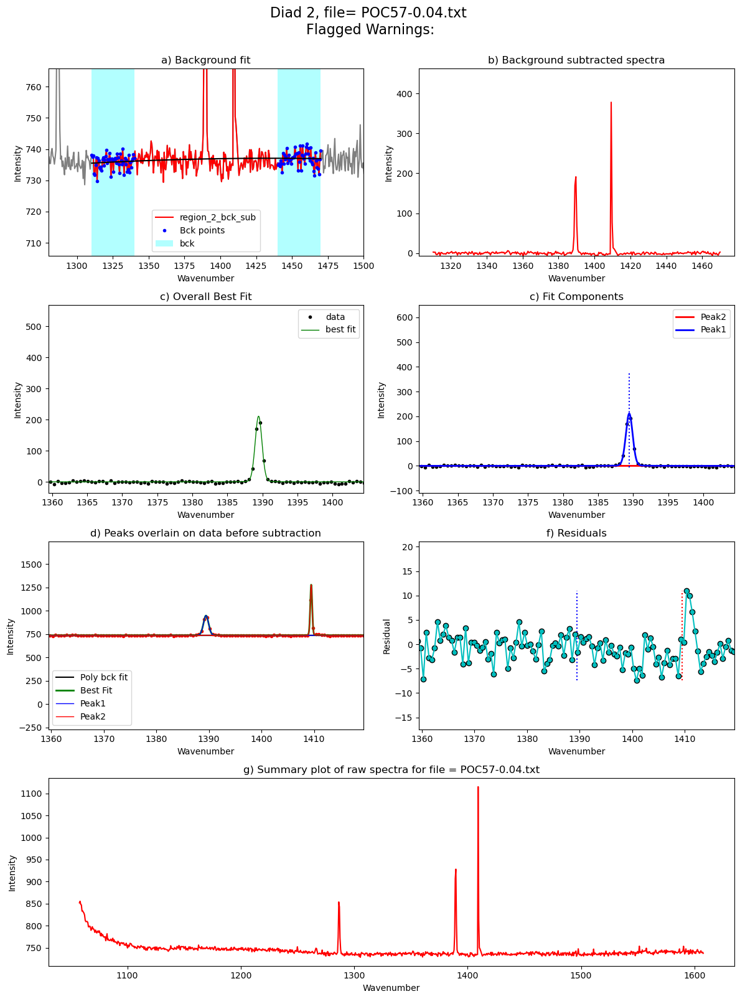

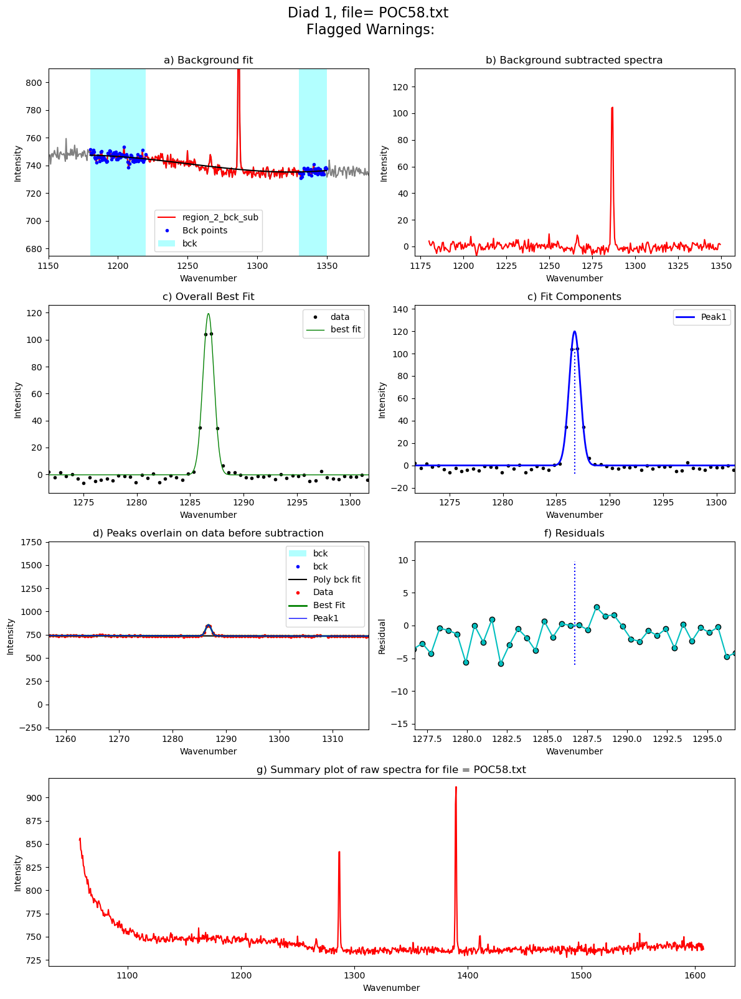

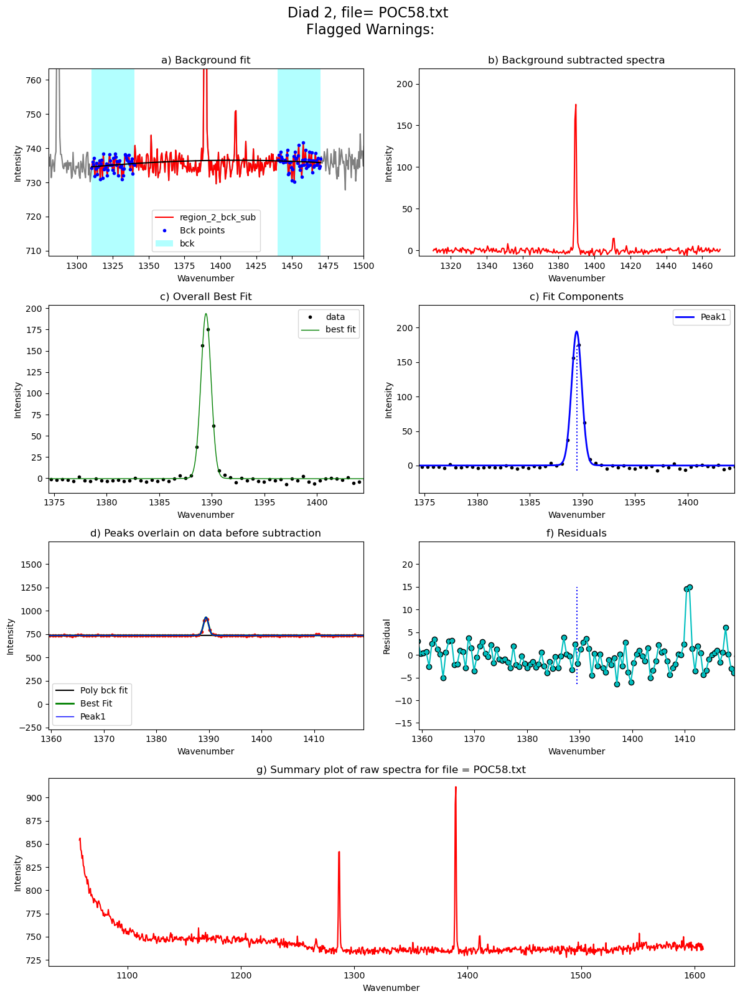

In [15]:
from tqdm import tqdm
plot_figure=True # If False, Means doesnt have to make figures, lot faster. 
close_figure=False # Means shows figures in the notebook itself
to_clipboard=False # Copies to clipboard
Diad_Files_Weak_i=Diad_Files_Weak
df_Weak = pd.DataFrame([])
for i in tqdm(range(0, len(Diad_Files_Weak))): #
    
    ## Diad 1 fit

    diad_id_config=pf.diad_id_config(height=50, exclude_range1=[1308, 1309])
    diad_id_config

    diad1_fit_config_init=pf.diad1_fit_config(
        model_name=model_name,
    N_poly_bck_diad1=3, lower_bck_diad1=(1180, 1220),
    upper_bck_diad1=(1330, 1350),
    diad_sigma=1,
    x_range_residual=10, x_range_baseline=30, 
     y_range_baseline=1000, 
        HB_prom=Group1_df['HB1_prom'].iloc[i], 
        diad_prom=Group1_df['Diad1_prom'].iloc[i])
    diad1_fit_config_init


    diad1_peaks=(Group1_df['Diad1_pos'].iloc[i], Group1_df['HB1_pos'].iloc[i])
    Diad1_fit=pf.fit_diad_1_w_bck(config1=diad1_fit_config_init,
    config2=diad_id_config,
    path=spectra_path, filename=Group1_df['filename'].iloc[i],
    filetype=filetype, close_figure=False,
    Diad_pos=Group1_df['Diad1_pos'].iloc[i],
    HB_pos=Group1_df['HB1_pos'].iloc[i], 
     fit_peaks=2)
    Diad1_fit



    ## Diad 2
    diad2_fit_config_init=pf.diad2_fit_config(model_name=model_name, 
    lower_bck_diad2=(1310, 1340), diad_sigma=1,  N_poly_bck_diad2=2,                                       
    x_range_residual=30, y_range_baseline=1000,  
    x_range_baseline=30,
    HB_prom=Group1_df['HB2_prom'].iloc[i], 
    diad_prom=Group1_df['Diad2_prom'].iloc[i])



    Diad2_fit=pf.fit_diad_2_w_bck(config1=diad2_fit_config_init,
        config2=diad_id_config,
    path=spectra_path, filename=Group1_df['filename'].iloc[i], filetype=filetype,
    close_figure=False, 
    fit_peaks=2, 
    Diad_pos=Group1_df['Diad2_pos'].iloc[i],
    HB_pos=Group1_df['HB2_pos'].iloc[i], 
    C13_pos=Group1_df['C13_pos'].iloc[i])
    Diad2_fit.to_clipboard(excel=True)


 
    fit_sec_peak=False

    data=pf.combine_diad_outputs(filename=Group1_df['filename'].iloc[i], prefix=False, 
    Diad1_fit=Diad1_fit, path=spectra_path,
     to_clipboard=to_clipboard,                    
    Diad2_fit=Diad2_fit)        
    
 

    df_Weak = pd.concat([df_Weak, data], axis=0)


In [17]:
refit_d1=(df_Weak['Diad1_refit']!='Flagged Warnings:')
refit_d2=(df_Weak['Diad2_refit']!='Flagged Warnings:')# (df_Weak['Diad2_refit']==True)
refit=refit_d1|refit_d2
print(sum(refit))
refit_names_1=df_Weak['filename'].loc[refit]
print(refit_names_1)

0
Series([], Name: filename, dtype: object)


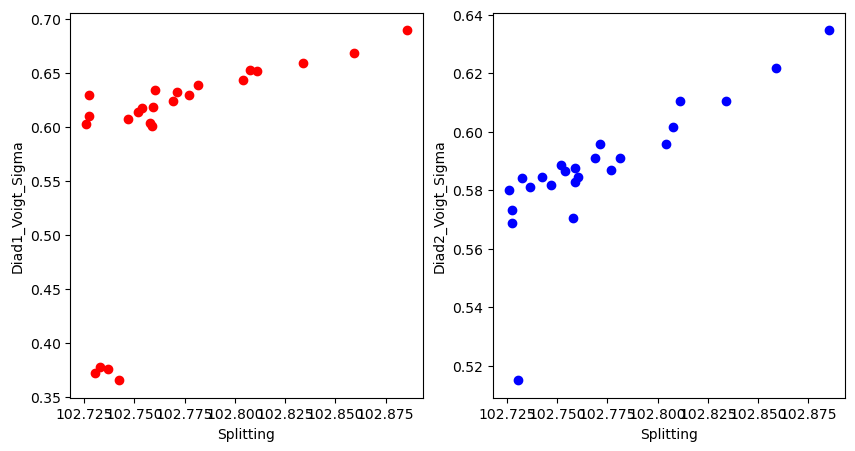

In [18]:

x='Splitting'
y1='Diad1_Voigt_Sigma'
y2='Diad2_Voigt_Sigma'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Weak[x], df_Weak[y1], 'or')
ax2.plot(df_Weak[x], df_Weak[y2], 'ob')
ax1.plot(df_Weak[x].loc[refit_d1], df_Weak[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Weak[x].loc[refit_d2], df_Weak[y2].loc[refit_d2], 'xk', ms=10)
ax1.set_xlabel(x)
ax2.set_xlabel(x)
ax1.set_ylabel(y1)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Weak #.loc[(df_Weak['Diad1_Voigt_Area']>25) & (df_Weak['Diad2_Voigt_Area']>30)]

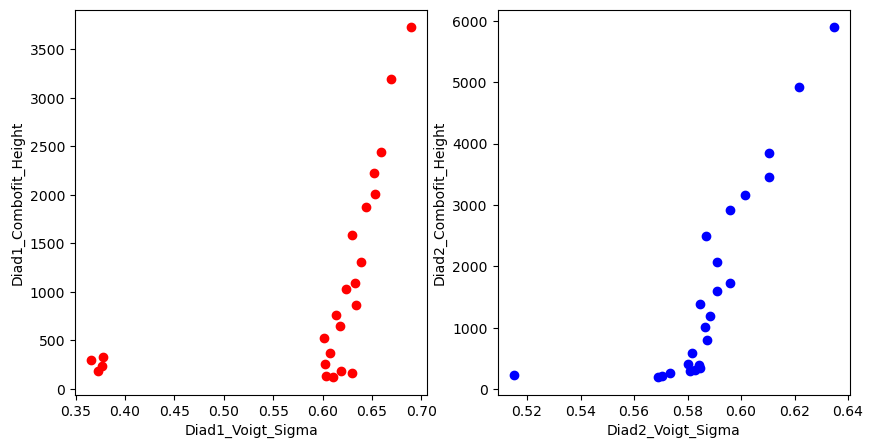

In [19]:
x1='Diad1_Voigt_Sigma'
x2='Diad2_Voigt_Sigma'
y1='Diad1_Combofit_Height'
y2='Diad2_Combofit_Height'
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
ax1.plot(df_Weak[x1], df_Weak[y1], 'or')
ax2.plot(df_Weak[x2], df_Weak[y2], 'ob')
ax1.plot(df_Weak[x1].loc[refit_d1], df_Weak[y1].loc[refit_d1], 'xk', ms=10)
ax2.plot(df_Weak[x2].loc[refit_d2], df_Weak[y2].loc[refit_d2], 'xk', ms=10)

ax1.set_xlabel(x1)
ax1.set_ylabel(y1)
ax2.set_xlabel(x2)
ax2.set_ylabel(y2)
df_not_too_Weak=df_Weak #.loc[(df_Weak['Diad1_Voigt_Area']>25) & (df_Weak['Diad2_Voigt_Area']>30)]

In [21]:
combo=df_Weak

In [22]:
combo.to_excel('Weak_Diads.xlsx')

In [ ]:
combo.to_clipboard(excel=True)

## how does prominence scale to amplitude

In [23]:
combo.head()

,filename,Splitting,Diad1_Combofit_Cent,Diad1_Combofit_Height,Diad1_Voigt_Cent,Diad1_Voigt_Area,Diad1_Voigt_Sigma,Residual_Diad1,Diad1_Prop_Lor,Diad1_fwhm,...,Diad2_refit,HB1_Cent,HB1_Area,HB1_Sigma,HB2_Cent,HB2_Area,HB2_Sigma,C13_Cent,C13_Area,C13_Sigma
0,POC35,102.885496,1286.307946,3730.374605,1286.307996,6288.667917,0.689637,5.988372,0.400745,1.379274,...,Flagged Warnings:,1266.049680,710.412247,0.747996,1410.465781,944.598445,0.678777,NaN,NaN,NaN
0,POC36,102.859056,1286.380048,3192.745811,1286.380098,5168.105860,0.668909,6.009178,0.373284,1.337819,...,Flagged Warnings:,1266.149334,568.694836,0.769910,1410.505932,758.303046,0.664861,NaN,NaN,NaN
0,POC37,102.833822,1286.448210,2445.374982,1286.448260,3863.309357,0.659204,4.440823,0.346691,1.318407,...,Flagged Warnings:,1266.173361,414.095307,0.777678,1410.546952,577.112088,0.667686,NaN,NaN,NaN
0,POC38,102.811080,1286.490990,2229.316615,1286.491040,3467.458219,0.652168,4.194504,0.333229,1.304335,...,Flagged Warnings:,1266.232860,364.223297,0.768825,1410.568766,507.881174,0.615504,NaN,NaN,NaN
0,POC39,102.807508,1286.514199,2008.715504,1286.514249,3121.670998,0.652678,4.212688,0.328686,1.305357,...,Flagged Warnings:,1266.227235,332.652724,0.748317,1410.567465,459.414558,0.646774,NaN,NaN,NaN


In [27]:
len(combo)

24

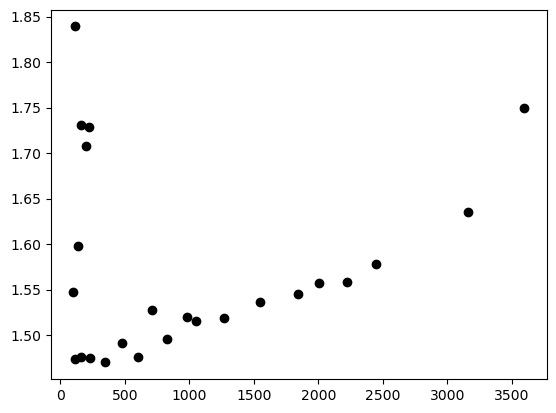

In [34]:
plt.plot(Group1_df['Diad1_prom'].values, 
combo['Diad1_Voigt_Area'].values/Group1_df['Diad1_prom'].values, 'ok')

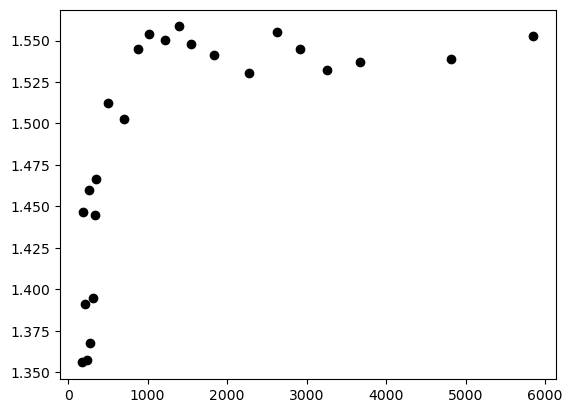

In [35]:
plt.plot(Group1_df['Diad2_prom'].values, 
combo['Diad2_Voigt_Area'].values/Group1_df['Diad2_prom'].values, 'ok')

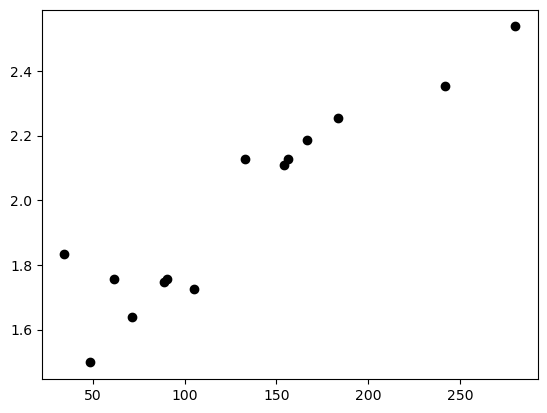

In [32]:
plt.plot(Group1_df['HB1_prom'].values, 
combo['HB1_Area'].values/Group1_df['HB1_prom'].values, 'ok')

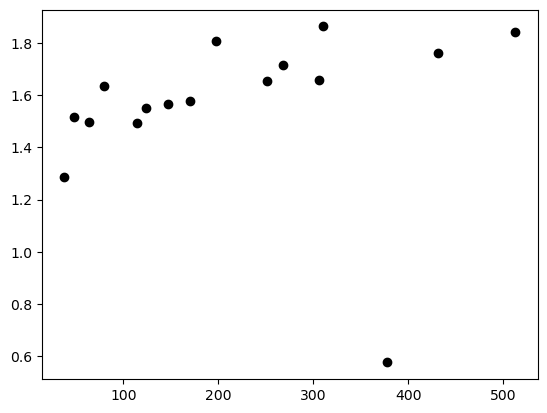

In [33]:
plt.plot(Group1_df['HB2_prom'].values, 
combo['HB2_Area'].values/Group1_df['HB2_prom'].values, 'ok')